## Hypothesis II - Proposed Modeling Approach IV

##### Input: Raw Images

##### Downstream Model: 3D-CNN

##### Validation: 75% / 25% split (stratified by cultivar)


In [1]:
import operator
import os
import datetime
import copy
import gc

import scipy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn.objects as so

import tensorflow as tf
from tensorflow.keras import layers
from tensorboard.plugins.hparams import api as hparams_api
import keras_tuner as kt

import imgaug

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error

import shap

import cv2

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


#### Remove noData Pixels Function


In [2]:
def filterNoData2(band):
    band_filtered = band

    operatorLookup = {">": operator.gt, "<": operator.lt}

    threshold = 100
    comparison = ">"

    # check if noData value is extremely large or small
    if len(band_filtered[band_filtered > 100]) > 0:
        threshold = 100
        comparison = ">"

    elif len(band_filtered[band_filtered < -100]) > 0:
        threshold = -100
        comparison = "<"

    op = operatorLookup.get(comparison)

    # find the indices of the non-noData pixels
    nonNoDataIndices = np.where(~op(band, threshold))

    # determine the minimum and maximum row and column indices of the non-noData pixels
    rowIndices = (min(nonNoDataIndices[0]), max(nonNoDataIndices[0]))
    colIndices = (min(nonNoDataIndices[1]), max(nonNoDataIndices[1]))

    # extract a subarray that only includes the non-noData pixels
    croppedImg = band[
        rowIndices[0] : rowIndices[1] + 1, colIndices[0] : colIndices[1] + 1
    ]

    band_filtered = croppedImg

    # iterate through rows
    offset = 0
    for row in range(0, band_filtered.shape[0]):
        # delete row if more than 1/3 of it contains noData values
        if len(np.argwhere(op(band_filtered[row - offset], threshold))) > 3:
            # if len(np.argwhere(op(band_filtered[row - offset], threshold))) > 0.15 * len(band_filtered[row - offset]):
            # print(f"Deleting row {row} with offset {offset}")
            band_filtered = np.delete(band_filtered, row - offset, 0)
            offset += 1

        row += 1

    # iterate through cols
    offset = 0
    for col in range(0, band_filtered.shape[1]):
        if len(np.argwhere(op(band_filtered[:, col - offset], threshold))) > 0:
            # print(f"Deleting column {col} with offset {offset}")
            band_filtered = np.delete(band_filtered, col - offset, 1)
            offset += 1

        col += 1

    return band_filtered

#### Load Yield Data


In [3]:
df_2021 = pd.read_csv("../../../Datasets/Agronomic/2021/Dataset_2021.csv")
df_2021 = df_2021.sort_values(by="Plot_Number")

# remove missing yield
df_2021 = df_2021[df_2021["Yield"].notna()].reset_index(drop=True)

# get plot Numbers
df_2021["Plot_Number"] = df_2021["Plot_Number"].astype(str)
plotNumbers_2021 = list(df_2021["Plot_Number"].unique())

# keep only necessary attributes
df_2021 = df_2021.iloc[:, [0, 1, 2, 5, 6, 7]]
df_2021

,Plot_Number,Rice_Cultivar,Experiment_Name,Nitrogen_Rate,Replicate,Yield
0,33761,IAC600,Tiara,75,1,6.002350
1,33762,Tiara,Tiara,75,1,5.922051
2,33763,Sierra,Tiara,75,1,8.331022
3,33764,Scarlett,Tiara,75,1,10.565055
4,33765,Tiara,Tiara,75,1,6.693495
...,...,...,...,...,...,...
219,35848,WAB462-10-3-1,Mini_Core,130,4,8.652218
220,35852,Jefferson,Mini_Core,130,4,10.722785
221,35853,EMBRAPA 1200,Mini_Core,130,4,10.430267
222,35856,XP753,Mini_Core,130,4,21.821254


#### Load and Preprocess Images


In [4]:
imgsPath = "../../../Datasets/Images"
lateBootDates = ["06-14-2021", "06-23-2021", "06-30-2021", "07-28-2021"]
RESIZE_DIM = (40, 18)

imgs = []
plotNumbers = np.empty((896, 18, 40, 5))
index = 0
dateIndex = 0

for imgSet in os.listdir(imgsPath):
    if imgSet == "Train":
        for date in os.listdir(os.path.join(imgsPath, imgSet)):
            # filter harvest dates
            if date in lateBootDates:
                for plotNumber in sorted(
                    os.listdir(os.path.join(imgsPath, imgSet, date))
                ):
                    # filter missing yield plots
                    if plotNumber in plotNumbers_2021:
                        imgDir = os.path.join(imgsPath, imgSet, date, plotNumber)

                        # read imgs -> filter noData pixels -> resize to predefined dimension
                        r = cv2.resize(
                            filterNoData2(
                                cv2.imread(os.path.join(imgDir, "red.tiff"), -1)
                            ),
                            RESIZE_DIM,
                            cv2.INTER_AREA,
                        )
                        g = cv2.resize(
                            filterNoData2(
                                cv2.imread(os.path.join(imgDir, "green.tiff"), -1)
                            ),
                            RESIZE_DIM,
                            cv2.INTER_AREA,
                        )
                        b = cv2.resize(
                            filterNoData2(
                                cv2.imread(os.path.join(imgDir, "blue.tiff"), -1)
                            ),
                            RESIZE_DIM,
                            cv2.INTER_AREA,
                        )
                        nir = cv2.resize(
                            filterNoData2(
                                cv2.imread(os.path.join(imgDir, "nir.tiff"), -1)
                            ),
                            RESIZE_DIM,
                            cv2.INTER_AREA,
                        )
                        r_e = cv2.resize(
                            filterNoData2(
                                cv2.imread(os.path.join(imgDir, "red_edge.tiff"), -1)
                            ),
                            RESIZE_DIM,
                            cv2.INTER_AREA,
                        )

                        # Stack the 5 channels
                        imgs.append(np.stack((r, g, b, nir, r_e), axis=2))

                        plotNumbers[index, :, :, 0] = (
                            float(plotNumber) + dateIndex / 10 + 0.01
                        )
                        plotNumbers[index, :, :, 1] = (
                            float(plotNumber) + dateIndex / 10 + 0.02
                        )
                        plotNumbers[index, :, :, 2] = (
                            float(plotNumber) + dateIndex / 10 + 0.03
                        )
                        plotNumbers[index, :, :, 3] = (
                            float(plotNumber) + dateIndex / 10 + 0.04
                        )
                        plotNumbers[index, :, :, 4] = (
                            float(plotNumber) + dateIndex / 10 + 0.05
                        )

                        index += 1

                dateIndex += 1

xAll = np.stack(imgs, axis=0)
del (
    r,
    g,
    b,
    nir,
    r_e,
    imgSet,
    date,
    plotNumber,
    imgDir,
    imgsPath,
    imgs,
    index,
    dateIndex,
)

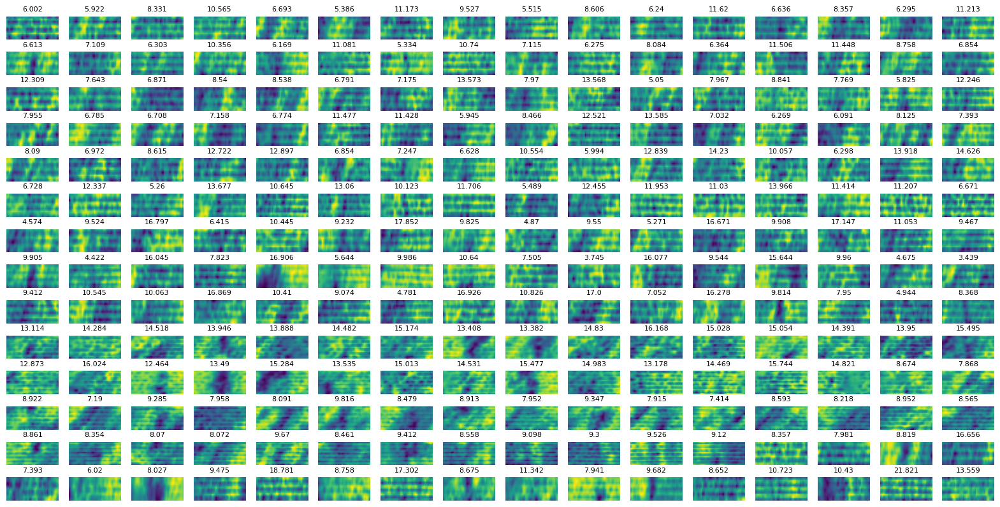

In [5]:
# Plot images for visual confirmation
plt.figure(figsize=(20, 10))
i = 1
j = 0

for k in np.arange(len(df_2021) * j, len(df_2021) + (len(df_2021) * j), 1):
    plt.subplot(14, 16, i)
    plt.imshow(xAll[k, :, :, 3])
    plt.axis("off")
    plt.title(round(df_2021.iloc[i - 1]["Yield"], 3), size=8)
    i += 1

del i, k, j

#### 3D CNN Preprocessing


In [6]:
# Reorder images such that the same plot across timepoints is consecutive (to be able to reshape later)
xAllTimepoints = np.empty(shape=xAll.shape)

counter = 0
plotNumbers_2 = np.empty((896, 18, 40, 5))
for plot in np.arange(0, len(df_2021), 1):
    for timepoint in np.arange(plot, len(xAll), len(df_2021)):
        xAllTimepoints[counter] = xAll[timepoint, :, :, :]
        plotNumbers_2[counter] = plotNumbers[timepoint]
        counter += 1

# add time dimension
N_TIMEPOINTS = 4
xAllTimepoints = xAllTimepoints.reshape(
    (len(df_2021), N_TIMEPOINTS) + xAllTimepoints.shape[1:]
)
plotNumbers_2 = plotNumbers_2.reshape((len(df_2021), N_TIMEPOINTS, 18, 40, 5))

del counter, plot, timepoint

#### Visually Validate Reordering


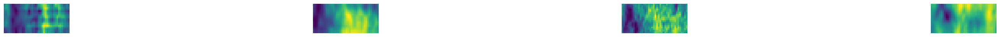

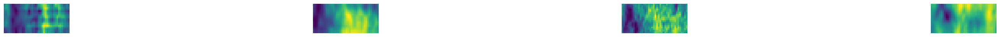

In [7]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(40, 1))
plot = 221

counter = 0
for i in np.arange(plot, len(xAll), len(df_2021)):
    axes[counter].imshow(xAll[i, :, :, 3])
    axes[counter].set_axis_off()
    counter += 1

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(40, 1))

counter = 0
for i in np.arange(0, xAllTimepoints.shape[1], 1):
    axes[counter].imshow(xAllTimepoints[plot, i, :, :, 3])
    axes[counter].set_axis_off()
    counter += 1

del fig, axes, counter, i, plot

In [7]:
VAL_RATIO = 0.25
sample = train_test_split(
    df_2021.index,
    df_2021.Yield,
    test_size=VAL_RATIO,
    random_state=100,
    stratify=df_2021.Rice_Cultivar,
)

xTrain = xAllTimepoints[sample[0], :]
xVal = xAllTimepoints[sample[1], :]

yTrain = sample[2].values
yVal = sample[3].values

In [8]:
# standardize images
scaler = StandardScaler()
xTrainScaled = scaler.fit_transform(xTrain.reshape(-1, xTrain.shape[-1])).reshape(
    xTrain.shape
)
xValScaled = scaler.transform(xVal.reshape(-1, xVal.shape[-1])).reshape(xVal.shape)

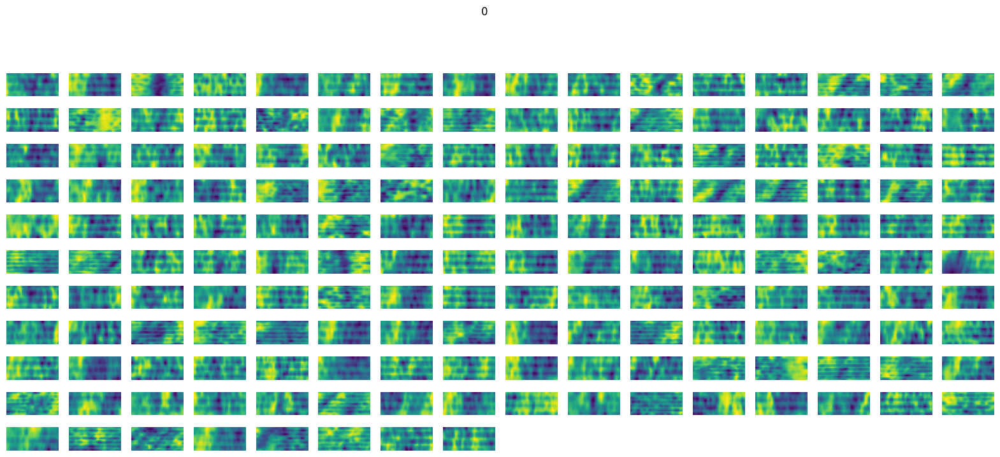

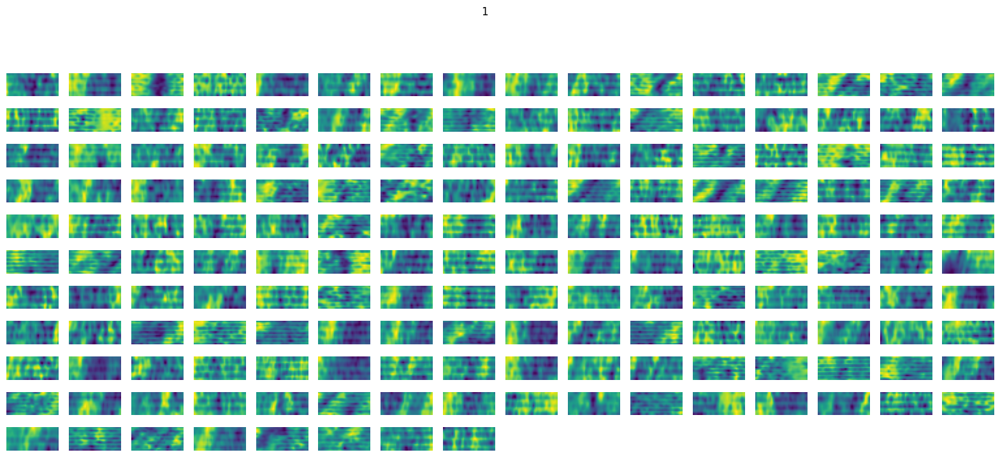

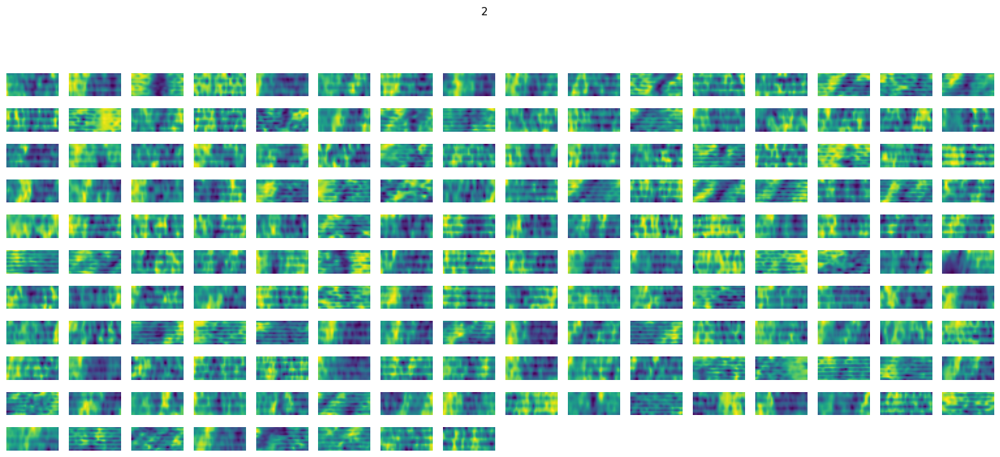

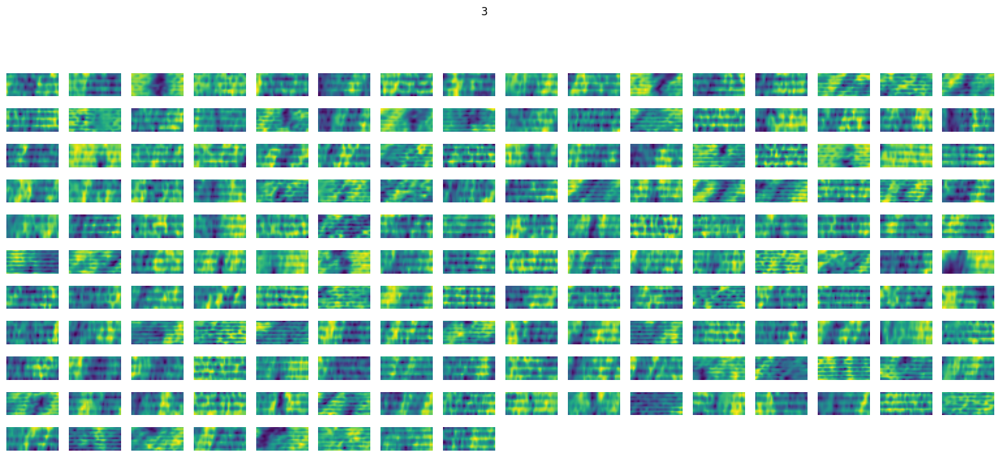

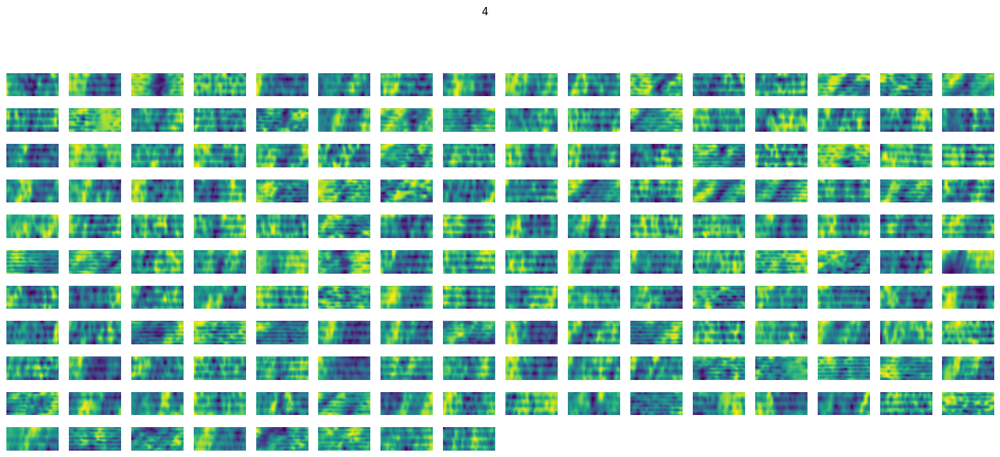

In [9]:
# Plot standardized images for visual confirmation
j = 0

for channel in range(xTrainScaled.shape[-1]):
    plt.figure(figsize=(20, 10))
    i = 1
    for k in np.arange(0, xTrainScaled.shape[0], 1):
        plt.subplot(14, 16, i)
        plt.imshow(xTrainScaled[k, j, :, :, channel])
        plt.axis("off")
        plt.suptitle(channel)
        i += 1

del i, k, j, channel

In [9]:
df_2021.groupby(["Experiment_Name", "Rice_Cultivar"]).count()

Plot_Number  Nitrogen_Rate  Replicate  \
Experiment_Name   Rice_Cultivar                                            
Hybrid_XP753      XP753                     30             30         30   
Inbred_Jeff + NIL Jefferson                 15             15         15   
                  NIL 43                    15             15         15   
Mini_Core         EMBRAPA 1200               4              4          4   
                  Jefferson                  4              4          4   
                  M-202                      4              4          4   
                  WAB462-10-3-1              4              4          4   
                  XP753                      4              4          4   
Santee_Gold       Carolina Gold             18             18         18   
                  Charleston Gold           18             18         18   
                  RoyJ                      18             18         18   
                  Santee Gold               18             18         18   
Tiara             IAC600                    18             18         18   
                  Scarlett                  18             18         18   
                  Sierra                    18             18         18   
                  Tiara                     18             18         18   

                                   Yield  
Experiment_Name   Rice_Cultivar           
Hybrid_XP753      XP753               30  
Inbred_Jeff + NIL Jefferson           15  
                  NIL 43              15  
Mini_Core         EMBRAPA 1200         4  
                  Jefferson            4  
                  M-202                4  
                  WAB462-10-3-1        4  
                  XP753                4  
Santee_Gold       Carolina Gold       18  
                  Charleston Gold     18  
                  RoyJ                18  
                  Santee Gold         18  
Tiara             IAC600              18  
                  Scarlett            18  
                  Sierra              18  
                  Tiara               18

In [10]:
df_2021.iloc[sample[0]].groupby(["Experiment_Name", "Rice_Cultivar"]).count()

Plot_Number  Nitrogen_Rate  Replicate  \
Experiment_Name   Rice_Cultivar                                            
Hybrid_XP753      XP753                     22             22         22   
Inbred_Jeff + NIL Jefferson                 12             12         12   
                  NIL 43                    11             11         11   
Mini_Core         EMBRAPA 1200               3              3          3   
                  Jefferson                  2              2          2   
                  M-202                      3              3          3   
                  WAB462-10-3-1              3              3          3   
                  XP753                      3              3          3   
Santee_Gold       Carolina Gold             13             13         13   
                  Charleston Gold           14             14         14   
                  RoyJ                      13             13         13   
                  Santee Gold               14             14         14   
Tiara             IAC600                    14             14         14   
                  Scarlett                  14             14         14   
                  Sierra                    14             14         14   
                  Tiara                     13             13         13   

                                   Yield  
Experiment_Name   Rice_Cultivar           
Hybrid_XP753      XP753               22  
Inbred_Jeff + NIL Jefferson           12  
                  NIL 43              11  
Mini_Core         EMBRAPA 1200         3  
                  Jefferson            2  
                  M-202                3  
                  WAB462-10-3-1        3  
                  XP753                3  
Santee_Gold       Carolina Gold       13  
                  Charleston Gold     14  
                  RoyJ                13  
                  Santee Gold         14  
Tiara             IAC600              14  
                  Scarlett            14  
                  Sierra              14  
                  Tiara               13

In [11]:
df_2021.iloc[sample[1]].groupby(["Experiment_Name", "Rice_Cultivar"]).count()

Plot_Number  Nitrogen_Rate  Replicate  \
Experiment_Name   Rice_Cultivar                                            
Hybrid_XP753      XP753                      8              8          8   
Inbred_Jeff + NIL Jefferson                  3              3          3   
                  NIL 43                     4              4          4   
Mini_Core         EMBRAPA 1200               1              1          1   
                  Jefferson                  2              2          2   
                  M-202                      1              1          1   
                  WAB462-10-3-1              1              1          1   
                  XP753                      1              1          1   
Santee_Gold       Carolina Gold              5              5          5   
                  Charleston Gold            4              4          4   
                  RoyJ                       5              5          5   
                  Santee Gold                4              4          4   
Tiara             IAC600                     4              4          4   
                  Scarlett                   4              4          4   
                  Sierra                     4              4          4   
                  Tiara                      5              5          5   

                                   Yield  
Experiment_Name   Rice_Cultivar           
Hybrid_XP753      XP753                8  
Inbred_Jeff + NIL Jefferson            3  
                  NIL 43               4  
Mini_Core         EMBRAPA 1200         1  
                  Jefferson            2  
                  M-202                1  
                  WAB462-10-3-1        1  
                  XP753                1  
Santee_Gold       Carolina Gold        5  
                  Charleston Gold      4  
                  RoyJ                 5  
                  Santee Gold          4  
Tiara             IAC600               4  
                  Scarlett             4  
                  Sierra               4  
                  Tiara                5

#### Plot Yield Distributions


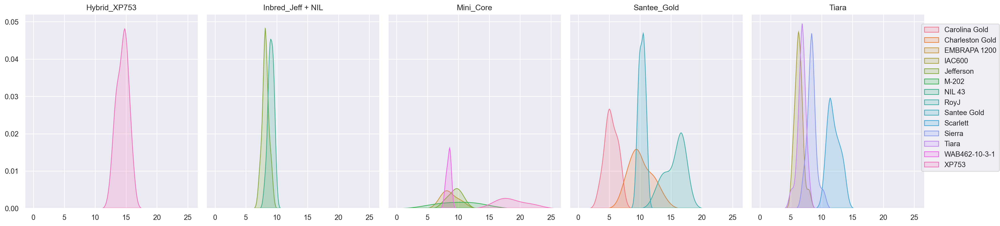

In [12]:
# original
(
    so.Plot(df_2021, x="Yield", color="Rice_Cultivar")
    .layout(size=(20, 5))
    .facet(
        col="Experiment_Name",
        order=[
            "Hybrid_XP753",
            "Inbred_Jeff + NIL",
            "Mini_Core",
            "Santee_Gold",
            "Tiara",
        ],
    )
    .add(so.Area(), so.KDE())
    .label(x="", color="")
    .scale(color=so.Nominal(order=sorted(df_2021["Rice_Cultivar"].unique())))
    # .scale(color="Spectral")
)

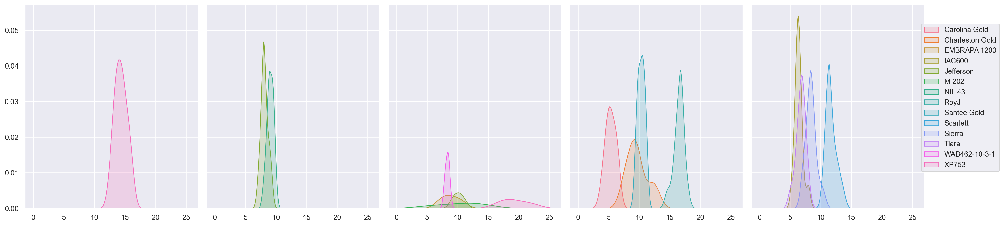

In [13]:
# train
(
    so.Plot(df_2021.iloc[sample[0]], x="Yield", color="Rice_Cultivar")
    .layout(size=(20, 5))
    .facet(
        col="Experiment_Name",
        order=[
            "Hybrid_XP753",
            "Inbred_Jeff + NIL",
            "Mini_Core",
            "Santee_Gold",
            "Tiara",
        ],
    )
    .add(so.Area(), so.KDE())
    .label(x="", color="", title="")
    .scale(color=so.Nominal(order=sorted(df_2021["Rice_Cultivar"].unique())))
    # .scale(color="Spectral")
)

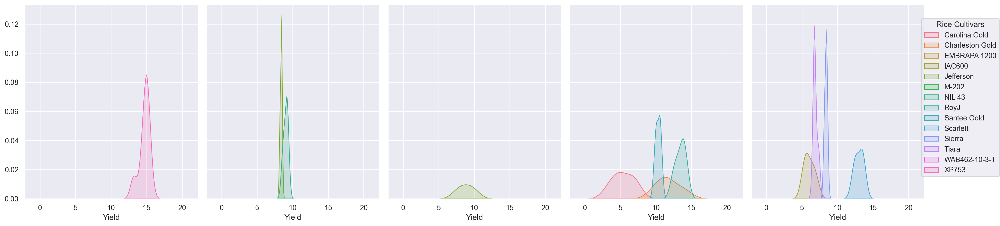

In [14]:
# val
(
    so.Plot(df_2021.iloc[sample[1]], x="Yield", color="Rice_Cultivar")
    .layout(size=(20, 5))
    .facet(
        col="Experiment_Name",
        order=[
            "Hybrid_XP753",
            "Inbred_Jeff + NIL",
            "Mini_Core",
            "Santee_Gold",
            "Tiara",
        ],
    )
    .label(x="Yield", color="Rice Cultivars", title="")
    .add(so.Area(), so.KDE())
    .scale(color=so.Nominal(order=sorted(df_2021["Rice_Cultivar"].unique())))
)

#### Custom Data Augmentation


In [10]:
class CustomDataGenerator(tf.keras.utils.Sequence):
    "Generates data for Keras"

    def __init__(
        self,
        X,
        y,
        batch_size=28,
        dim=(N_TIMEPOINTS, 18, 40),
        n_channels=5,
        shuffle=False,
        augment=False,
    ):
        "Initialization"
        self.X = X
        self.y = y
        self.batch_size = batch_size
        self.dim = dim
        self.n_channels = n_channels
        self.shuffle = shuffle
        self.augment = augment
        self.on_epoch_end()

    def __len__(self):
        "Denotes the number of batches per epoch"
        return int(np.floor(len(self.X) / self.batch_size))

    def __getitem__(self, index):
        "Generate one batch of data"
        # Generate indexes of the batch
        indexes = self.indexes[index * self.batch_size : (index + 1) * self.batch_size]

        # Generate data
        X, y = self.__data_generation(indexes)

        return X, y

    def on_epoch_end(self):
        "Updates indexes after each epoch"
        self.indexes = np.arange(self.X.shape[0])
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, X_temp):
        "Generates data containing batch_size samples"
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size), dtype=float)

        # Generate data
        for i, index in enumerate(X_temp):
            # Store sample
            X[i,] = self.X[index]

            # Store yield label
            y[i] = self.y[index]

        if self.augment:
            X = self.augment_images(X)

        return X, y

    def augment_images(self, imgs):
        "Randomly applies augmentation to images"
        for i in range(len(imgs)):
            lefRightProb = tf.random.uniform([]).numpy() > 0.5
            upDownProb = tf.random.uniform([]).numpy() > 0.5
            rotateProb = tf.random.uniform([]).numpy() > 0.5
            scaleProb = tf.random.uniform([]).numpy() > 0.5

            rotateAngle = tf.random.uniform([], minval=-25, maxval=25).numpy()
            scaleFactor = tf.random.uniform([], minval=0.6, maxval=1.4).numpy()

            # apply same augmentation to each timepoint of a single plot
            for timepoint in range(imgs[i].shape[0]):
                imgs[i, timepoint] = tf.cond(
                    lefRightProb,
                    lambda: imgaug.augmenters.flip.fliplr(imgs[i, timepoint]),
                    lambda: imgs[i, timepoint],
                )

                imgs[i, timepoint] = tf.cond(
                    upDownProb,
                    lambda: imgaug.augmenters.flip.flipud(imgs[i, timepoint]),
                    lambda: imgs[i, timepoint],
                )

                imgs[i, timepoint] = tf.cond(
                    rotateProb,
                    lambda: imgaug.augmenters.geometric.Affine(
                        rotate=rotateAngle,
                        mode="reflect",
                    )(image=imgs[i, timepoint]),
                    lambda: imgs[i, timepoint],
                )

                imgs[i, timepoint] = tf.cond(
                    scaleProb,
                    lambda: imgaug.augmenters.geometric.Affine(
                        scale=scaleFactor,
                        mode="reflect",
                    )(image=imgs[i, timepoint]),
                    lambda: imgs[i, timepoint],
                )

        return imgs

In [12]:
test = CustomDataGenerator(xValScaled, yVal, augment=False)
test.on_epoch_end()
test = test.__getitem__(index=1)

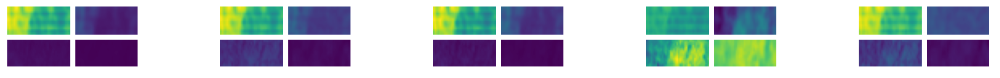

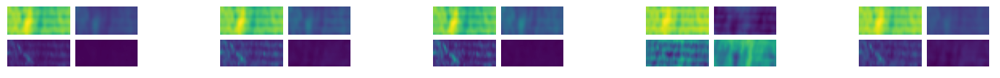

In [13]:
padding = 2
temp = np.stack((xTrainScaled[1], test[0][1]), axis=0)

# Iterate through the layers and feature maps
for img in temp:
    if len(img.shape) == 4:
        numFilters = img.shape[-1]
        numRows = 8  # Number of rows for sub-squares
        numCols = 8  # Number of columns for sub-squares

        fig = plt.figure(figsize=(30, 10))

        for i in range(numFilters):
            ax = fig.add_subplot(numRows, numCols, i + 1)

            # Stack the frames from the feature map
            stackedImage = img[:, :, :, i]

            # Calculate the dimensions for sub-squares with padding
            subSquareSize = (
                stackedImage.shape[1] + padding,
                stackedImage.shape[2] + padding,
            )

            # Create a canvas for arranging the sub-squares
            canvas = np.ones((2 * subSquareSize[0], 2 * subSquareSize[1])) * np.nan

            # Place each frame in a sub-square with padding
            for j in range(stackedImage.shape[0]):
                row = j // 2
                col = j % 2
                frame = stackedImage[j, :, :]
                canvas[
                    row * subSquareSize[0] : (row + 1) * subSquareSize[0] - padding,
                    col * subSquareSize[1] : (col + 1) * subSquareSize[1] - padding,
                ] = frame

            ax.imshow(canvas, cmap="viridis")
            # ax.set_title(f"Filter {i + 1}")
            ax.axis("off")

        plt.subplots_adjust(
            wspace=0.1, hspace=0.1
        )  # Adjust spacing between sub-squares
        plt.show()

#### Build 3D-CNN Architecture


In [14]:
tf.keras.backend.clear_session()
gc.collect()

inputShape = xTrainScaled.shape[1:]
model = tf.keras.Sequential(
    [
        layers.Input(shape=inputShape),
        # conv 1
        layers.Conv3D(
            256,
            kernel_size=(1, 3, 4),
            activation="relu",
            padding="same",
        ),
        layers.BatchNormalization(momentum=0.99),
        layers.MaxPooling3D((1, 3, 1)),
        # conv 2
        layers.Conv3D(
            256,
            kernel_size=(4, 2, 2),
            activation="relu",
            padding="same",
        ),
        layers.BatchNormalization(momentum=0.99),
        layers.SpatialDropout3D(0.1),
        layers.MaxPooling3D((1, 1, 3)),
        # conv 3
        layers.Conv3D(
            64,
            kernel_size=(4, 2, 4),
            activation="relu",
            padding="same",
        ),
        layers.BatchNormalization(momentum=0.99),
        # conv 4
        layers.Conv3D(
            128,
            kernel_size=(2, 2, 4),
            activation="relu",
            padding="same",
        ),
        layers.BatchNormalization(momentum=0.99),
        layers.SpatialDropout3D(0.1),
        ###########################################
        layers.Flatten(),
        # # dense 1
        layers.Dense(64, activation="relu"),
        # # dense 2
        layers.Dense(64, activation="relu"),
        ###########################################
        # output layer
        layers.Dense(1, activation="linear"),
    ]
)

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.0001),
    loss="mse",
    metrics=[
        tf.keras.metrics.RootMeanSquaredError(),
        tf.keras.metrics.MeanAbsoluteError(),
    ],
)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d (Conv3D)             (None, 4, 18, 40, 256)    15616     
                                                                 
 batch_normalization (BatchN  (None, 4, 18, 40, 256)   1024      
 ormalization)                                                   
                                                                 
 max_pooling3d (MaxPooling3D  (None, 4, 6, 40, 256)    0         
 )                                                               
                                                                 
 conv3d_1 (Conv3D)           (None, 4, 6, 40, 256)     1048832   
                                                                 
 batch_normalization_1 (Batc  (None, 4, 6, 40, 256)    1024      
 hNormalization)                                                 
                                                        

In [15]:
trainGenerator = CustomDataGenerator(xTrainScaled, yTrain, shuffle=True, augment=True)
valGenerator = CustomDataGenerator(xValScaled, yVal, shuffle=False, augment=False)

history = model.fit(
    trainGenerator,
    epochs=200,
    validation_data=valGenerator,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor="val_loss", patience=15, restore_best_weights=True
        ),
    ],
)

Epoch 1/200
6/6 [==============================] - 12s 560ms/step - loss: 35.6615 - root_mean_squared_error: 5.9717 - mean_absolute_error: 4.6497 - val_loss: 108.8264 - val_root_mean_squared_error: 10.4320 - val_mean_absolute_error: 9.9016
Epoch 2/200
6/6 [==============================] - 4s 665ms/step - loss: 11.6464 - root_mean_squared_error: 3.4127 - mean_absolute_error: 2.6219 - val_loss: 104.3313 - val_root_mean_squared_error: 10.2143 - val_mean_absolute_error: 9.6802
Epoch 3/200
6/6 [==============================] - 3s 538ms/step - loss: 7.1366 - root_mean_squared_error: 2.6714 - mean_absolute_error: 2.0715 - val_loss: 101.8132 - val_root_mean_squared_error: 10.0903 - val_mean_absolute_error: 9.5508
Epoch 4/200
6/6 [==============================] - 3s 541ms/step - loss: 6.0025 - root_mean_squared_error: 2.4500 - mean_absolute_error: 1.9419 - val_loss: 100.6474 - val_root_mean_squared_error: 10.0323 - val_mean_absolute_error: 9.4939
Epoch 5/200
6/6 [============================

#### Visualize Errors


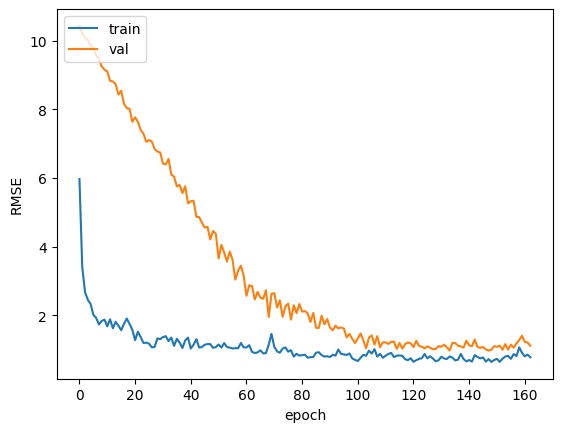

In [16]:
plt.plot(history.history["root_mean_squared_error"])
plt.plot(history.history["val_root_mean_squared_error"])
# plt.plot(history.history['val_loss'])
plt.ylabel("RMSE")
plt.xlabel("epoch")
plt.legend(["train", "val"], loc="upper left")
plt.show()

In [28]:
trainPreds = model.predict(xTrainScaled)
trainDf = df_2021.iloc[sample[0]].reset_index(drop=True)
trainDf["Yield_pred"] = trainPreds

valPreds = model.predict(xValScaled)
valDf = df_2021.iloc[sample[1]].reset_index(drop=True)
valDf["Yield_pred"] = valPreds

print(f"Train RMSE: {mean_squared_error(yTrain, trainPreds, squared = False)}")
print(f"Train MAE: {mean_absolute_error(yTrain, trainPreds)}")
print(f"Train MBE: {np.mean(trainPreds - yTrain)}")
print("---------------------------------------------------------")
print(f"Val RMSE: {mean_squared_error(yVal, valPreds, squared = False)}")
print(f"Val MAE: {mean_absolute_error(yVal, valPreds)}")
print(f"Val MBE: {np.mean(valPreds - yVal)}")

2/2 [==============================] - 0s 190ms/step
Train RMSE: 0.49996305387504886
Train MAE: 0.42051068526628044
Train MBE: 0.3310659094100096
---------------------------------------------------------
Val RMSE: 0.9682480647798636
Val MAE: 0.7392357350552194
Val MBE: 0.15348787482681706


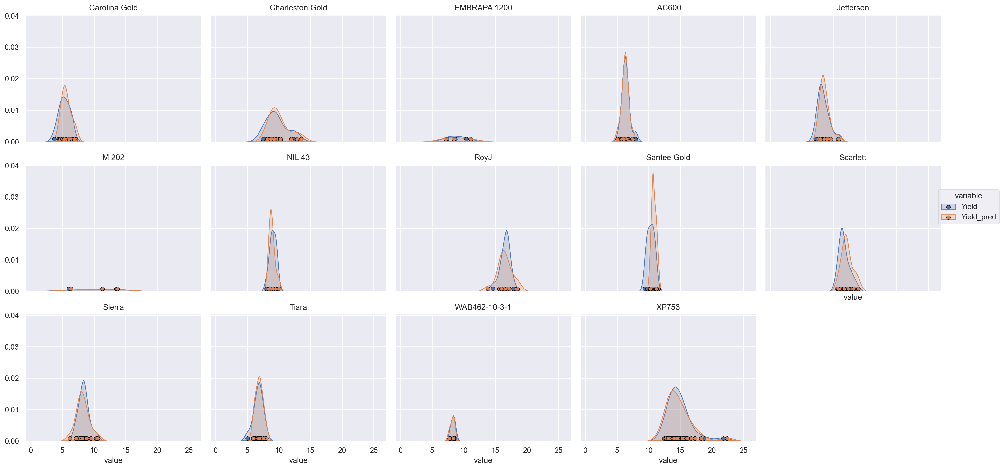

In [30]:
temp = pd.melt(
    trainDf, id_vars=trainDf.columns[:-2], value_vars=["Yield", "Yield_pred"]
)
(
    so.Plot(
        temp,
        x="value",
    )
    .layout(size=(20, 10))
    .facet(
        col="Rice_Cultivar",
        order=sorted(temp["Rice_Cultivar"].unique()),
        wrap=5,
    )
    .add(so.Area(), so.KDE(), color="variable")
    .add(so.Dot(edgecolor="black"), y=[0.0008] * len(temp), color="variable")
)

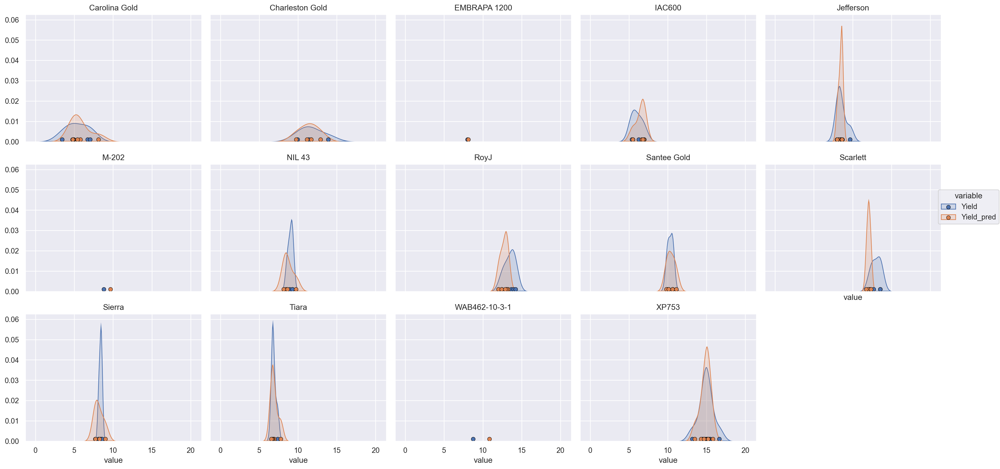

In [31]:
temp = pd.melt(valDf, id_vars=valDf.columns[:-2], value_vars=["Yield", "Yield_pred"])
(
    so.Plot(temp, x="value")
    .layout(size=(20, 10))
    .facet(
        col="Rice_Cultivar",
        order=sorted(temp["Rice_Cultivar"].unique()),
        wrap=5,
    )
    .add(so.Area(), so.KDE(), color="variable")
    .add(so.Dot(edgecolor="black"), y=[0.001] * len(temp), color="variable")
)

In [32]:
featureMapsModel = tf.keras.models.Model(
    inputs=model.input, outputs=[layer.output for layer in model.layers[1:]]
)

featureMaps = featureMapsModel.predict(xValScaled)
layerNames = [layer.name for layer in model.layers]

2/2 [==============================] - 0s 31ms/step


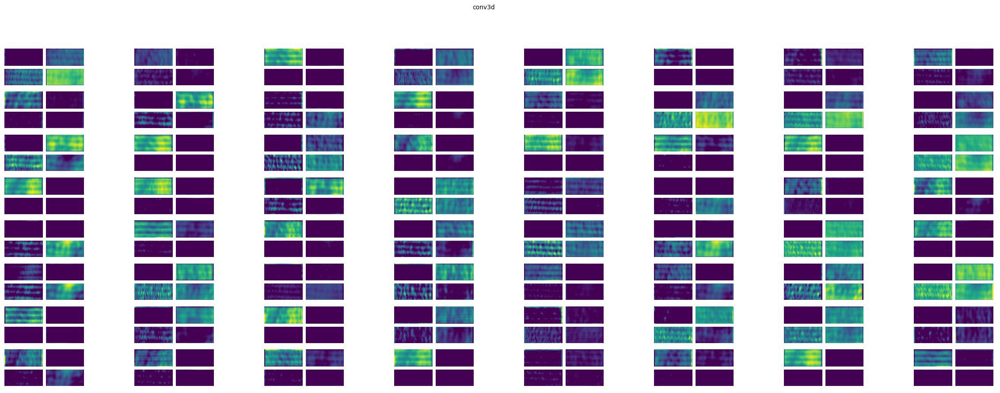

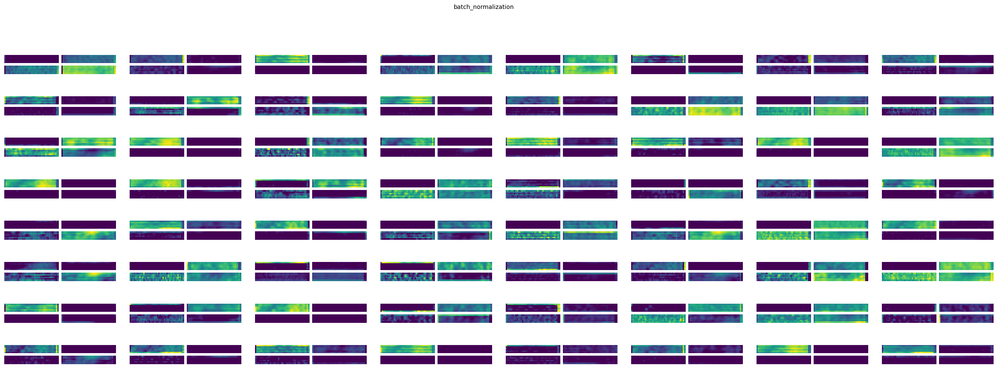

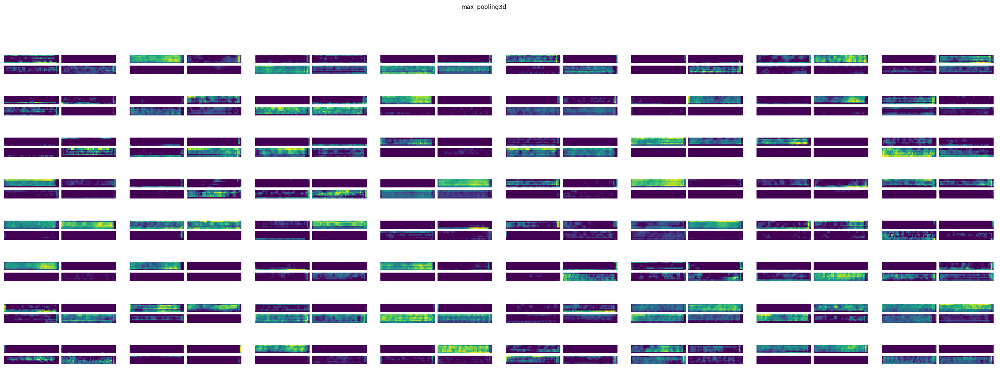

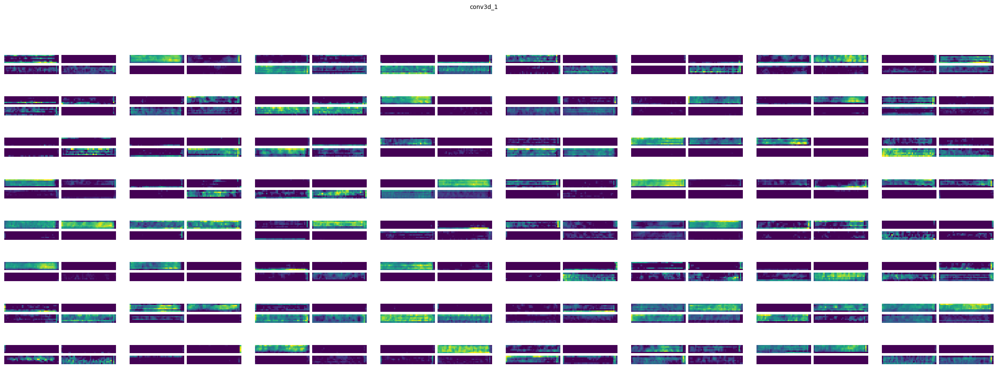

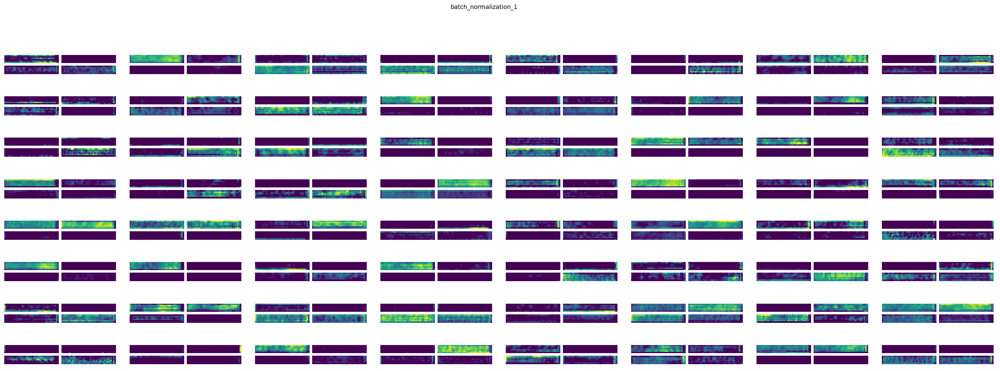

...

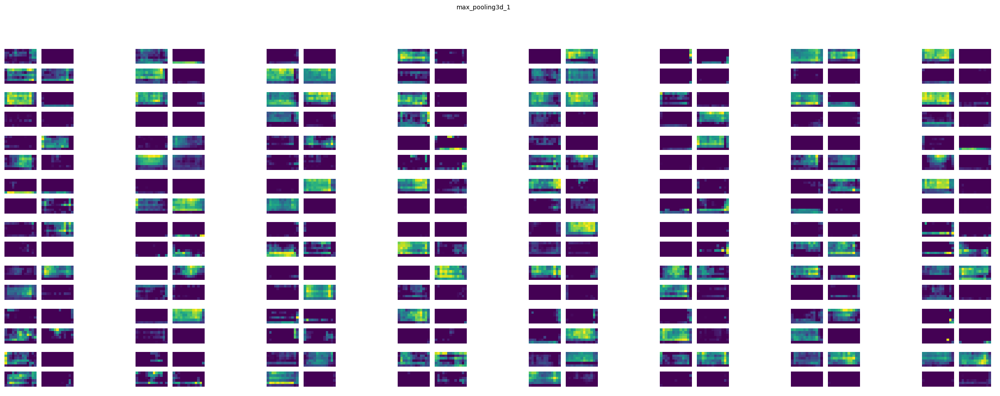

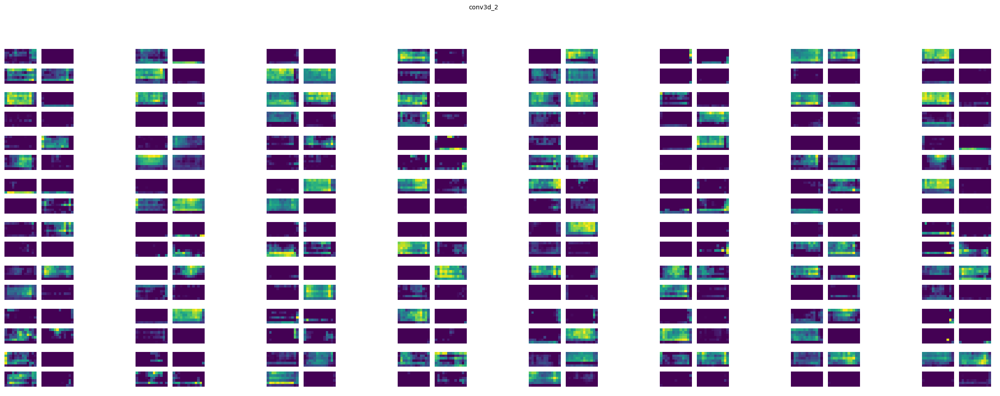

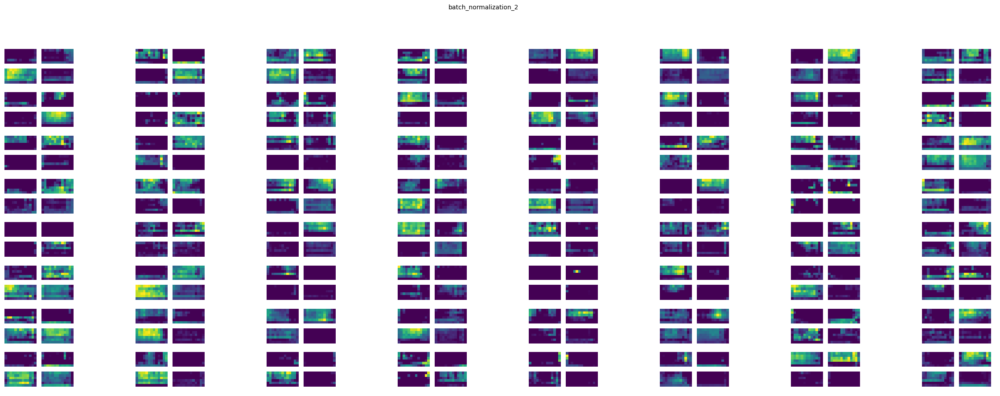

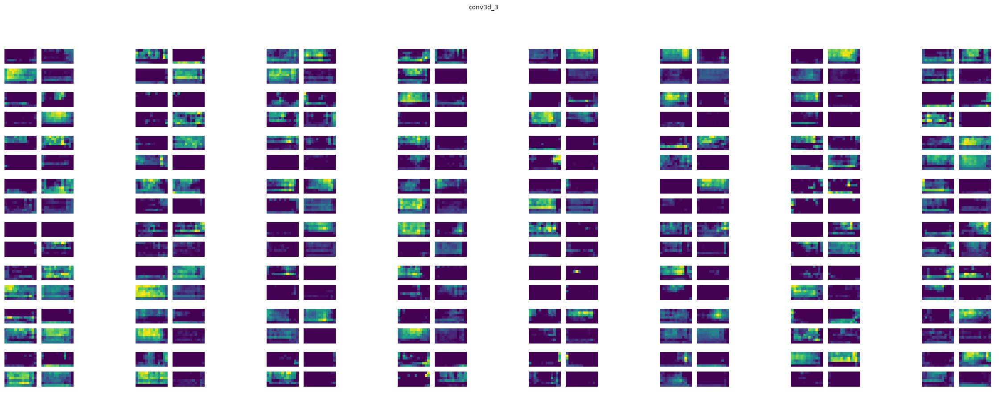

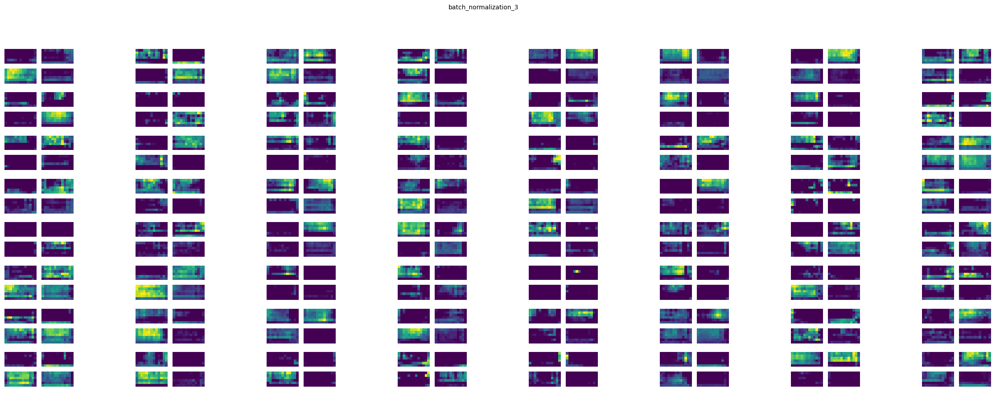

In [33]:
padding = 2

# Iterate through the layers and feature maps
for layerName, featureMap in zip(layerNames, featureMaps):
    if len(featureMap.shape) == 5:
        numFilters = min(featureMap.shape[-1], 64)
        numRows = 8  # Number of rows for sub-squares
        numCols = 8  # Number of columns for sub-squares

        fig = plt.figure(figsize=(30, 10))

        for i in range(numFilters):
            ax = fig.add_subplot(numRows, numCols, i + 1)

            # Stack the frames from the feature map
            stackedImage = featureMap[0, :, :, :, i]

            # Calculate the dimensions for sub-squares with padding
            subSquareSize = (
                stackedImage.shape[1] + padding,
                stackedImage.shape[2] + padding,
            )

            # Create a canvas for arranging the sub-squares
            canvas = np.ones((2 * subSquareSize[0], 2 * subSquareSize[1])) * np.nan

            # Place each frame in a sub-square with padding
            for j in range(stackedImage.shape[0]):
                row = j // 2
                col = j % 2
                frame = stackedImage[j, :, :]
                canvas[
                    row * subSquareSize[0] : (row + 1) * subSquareSize[0] - padding,
                    col * subSquareSize[1] : (col + 1) * subSquareSize[1] - padding,
                ] = frame

            ax.imshow(canvas, cmap="viridis")
            # ax.set_title(f"Filter {i + 1}")
            ax.axis("off")

        plt.subplots_adjust(
            wspace=0.1, hspace=0.1
        )  # Adjust spacing between sub-squares
        fig.suptitle(layerName, fontsize=10)
        plt.show()

#### Model Interpretation Using GRAD-CAM (slightly modified for regression)


In [34]:
def regressionActivationMap(img, model, lastConvLayerName, targetValue):
    gradModel = tf.keras.models.Model(
        [model.inputs], [model.get_layer(lastConvLayerName).output, model.output]
    )

    # compute the predicted value using the model
    with tf.GradientTape() as tape:
        lastConvOutput, pred = gradModel(img)

        # modify the loss function for regression (MSE loss)
        loss = tf.keras.losses.mean_squared_error(targetValue, pred)

    # compute gradients of the loss with respect to the activations of the last conv layer
    grads = tape.gradient(loss, lastConvOutput)

    # compute the weight of each feature map (global average pooling)
    grads = tf.abs(grads)
    pooledGrads = tf.reduce_mean(grads, axis=(0, 1, 2, 3))

    # compute a single heatmap by multiplying each feature map by its weight
    heatmap = lastConvOutput[0] @ pooledGrads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)

    return heatmap


def resizeHeatmap(heatmap, shape):
    heatmap = scipy.ndimage.zoom(
        heatmap,
        (
            shape[0] / heatmap.shape[0],
            shape[1] / heatmap.shape[1],
            shape[2] / heatmap.shape[2],
        ),
    )

    return heatmap

In [35]:
lastConvLayerName = "conv3d_3"
plotIndex = 20
heatmap = resizeHeatmap(
    regressionActivationMap(
        np.expand_dims(xValScaled[plotIndex], axis=0),
        model,
        lastConvLayerName,
        yVal[plotIndex],
    ),
    xValScaled[0].shape,
)

del lastConvLayerName

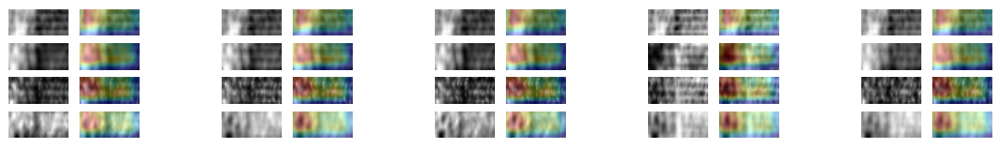

In [36]:
rows = xValScaled.shape[1]
cols = 2 * 5 + 4

row = 0
fig, ax = plt.subplots(rows, cols, figsize=(15, 2))
for timepoint in range(xValScaled.shape[1]):
    col = 0
    for channel in range(xVal.shape[-1]):
        ax[row, col].axis("off")

        if col in [2, 5, 8, 11]:
            col += 1

        ax[row, col].axis("off")
        ax[row, col + 1].axis("off")

        img0 = ax[row, col].imshow(
            xValScaled[plotIndex, timepoint, :, :, channel], cmap="gray"
        )
        ax[row, col + 1].imshow(
            xValScaled[plotIndex, timepoint, :, :, channel], cmap="gray"
        )
        img1 = ax[row, col + 1].imshow(
            heatmap[timepoint, :, :],
            cmap="jet",
            alpha=0.3,
            extent=img0.get_extent(),
        )

        col += 2

    row += 1

del img0, img1, rows, cols
plt.show()

#### Save Model


In [ ]:
model.save("./Saved_Models/H2A4M1.keras")